## Noise reduction


In [1]:
from scipy import signal
import matplotlib.pyplot as plt
import numpy as np
import librosa
from birdclassification.visualization.plots import plot_waveform
from birdclassification.preprocessing.filtering import filter_recordings_30
from birdclassification.preprocessing.augmentations import BandPass
import noisereduce as nr

/home/piotr/.local/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### Low pass filter response

##### Intuition behind the filter response plot:
1. Lower frequencies gain is 0dB
2. While frequencies below above 10^2 [rad/s] (cut-off frequency) are silenced (negative gain)

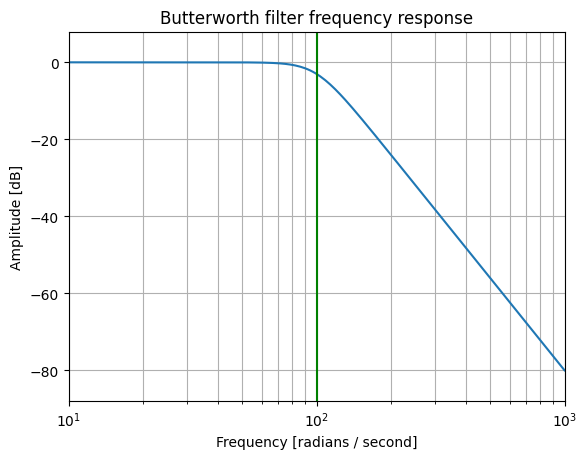

In [2]:
b, a = signal.butter(4, 100, 'low', analog=True)
w, h = signal.freqs(b, a)
plt.semilogx(w, 20 * np.log10(abs(h)))
plt.title('Butterworth filter frequency response')
plt.xlabel('Frequency [radians / second]')
plt.ylabel('Amplitude [dB]')
plt.margins(0, 0.1)
plt.grid(which='both', axis='both')
plt.axvline(100, color='green') # cutoff frequency
plt.show()

### Test on 10Hz signal

##### Testing the low-pass filter
1. Create a signal of 10Hz (signal) and 20Hz (noise)
2. Apply filter to retrieve the signal

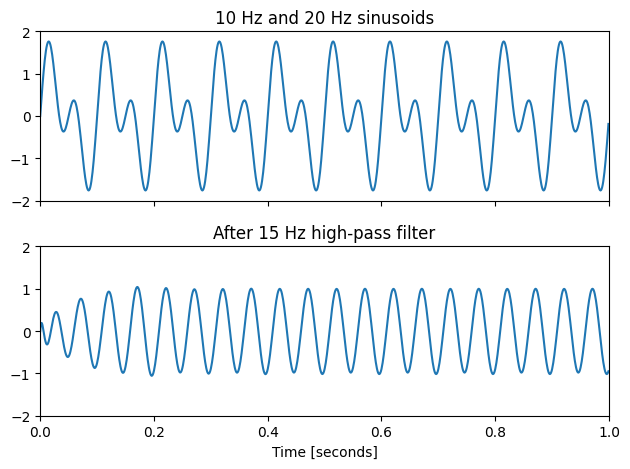

In [3]:
t = np.linspace(0, 1, 1000, False)  # 1 second
sig = np.sin(2*np.pi*10*t) + np.sin(2*np.pi*20*t)
fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True)
ax1.plot(t, sig)
ax1.set_title('10 Hz and 20 Hz sinusoids')
ax1.axis([0, 1, -2, 2])

sos = signal.butter(10, 15, 'hp', fs=1000, output='sos')
filtered = signal.sosfilt(sos, sig)
ax2.plot(t, filtered)
ax2.set_title('After 15 Hz high-pass filter')
ax2.axis([0, 1, -2, 2])
ax2.set_xlabel('Time [seconds]')
plt.tight_layout()
plt.show()

### Test of the bird recordings (band pass filter)

In [5]:
df = filter_recordings_30(filepath_bird_list='../../data/bird-list-extended.csv', filepath_recordings='../../data/xeno_canto_recordings.csv')
df

/home/piotr/thesis/Bird-classification-model/birdclassification/preprocessing/filtering.py:72: DtypeWarning: Columns (10,39,43,44,45,46,47,48) have mixed types. Specify dtype option on import or set low_memory=False.
  recordings = pd.read_csv(filepath_recordings)


,level_0,index,Unnamed: 0,id,gen,sp,ssp,group,en,rec,...,smp,Unnamed: 44,Unnamed: 45,Unnamed: 46,Unnamed: 47,Unnamed: 48,Unnamed: 49,Unnamed: 50,Unnamed: 51,Latin name
0,0,5,5,815762,Cygnus,olor,NaN,birds,Mute Swan,Frédéric Cazaban,...,44100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Cygnus olor
1,1,6,6,808540,Cygnus,olor,NaN,birds,Mute Swan,Juha Saari,...,44100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Cygnus olor
2,2,7,7,805048,Cygnus,olor,NaN,birds,Mute Swan,Magnus Hellström,...,44100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Cygnus olor
3,3,8,8,804791,Cygnus,olor,NaN,birds,Mute Swan,Uku Paal,...,44100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Cygnus olor
4,4,9,9,797609,Cygnus,olor,NaN,birds,Mute Swan,Jorge Leitão,...,44100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Cygnus olor
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41204,41205,296788,296788,108758,Columba,livia,NaN,birds,Rock Dove,Albert Lastukhin,...,44100.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Columba livia
41205,41206,296789,296789,58488,Columba,livia,NaN,birds,Rock Dove,Mike Nelson,...,44100.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Columba livia
41206,41207,296790,296790,6924,Columba,livia,domestica,birds,Rock Dove,Glauco Alves Pereira,...,22050.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Columba livia
41207,41208,296791,296791,387816,Columba,livia,NaN,birds,Rock Dove,johannes buhl,...,44100.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Columba livia


In [6]:
sample = df.sample(100, random_state=0)
sample

,level_0,index,Unnamed: 0,id,gen,sp,ssp,group,en,rec,...,smp,Unnamed: 44,Unnamed: 45,Unnamed: 46,Unnamed: 47,Unnamed: 48,Unnamed: 49,Unnamed: 50,Unnamed: 51,Latin name
12868,12868,104342,104342,129615,Garrulus,glandarius,NaN,birds,Eurasian Jay,maudoc,...,48000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Garrulus glandarius
26889,26890,216300,216300,735768,Phoenicurus,ochruros,NaN,birds,Black Redstart,Gil Lissens,...,48000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Phoenicurus ochruros
16380,16380,109271,109271,629461,Corvus,corax,NaN,birds,Northern Raven,Manuel Grosselet,...,44100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Corvus corax
13403,13403,104877,104877,453641,Garrulus,glandarius,NaN,birds,Eurasian Jay,Jorge Leitão,...,44100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Garrulus glandarius
14064,14064,105538,105538,195292,Garrulus,glandarius,NaN,birds,Eurasian Jay,Buhl Johannes,...,48000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Garrulus glandarius
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26609,26610,216020,216020,555421,Phoenicurus,ochruros,gibraltariensis,birds,Black Redstart,Ruslan Mazuryk,...,48000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Phoenicurus ochruros
30054,30055,233200,233200,555824,Passer,domesticus,NaN,birds,House Sparrow,Joost van Bruggen,...,48000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Passer domesticus
2134,2134,14094,14094,679055,Phasianus,colchicus,NaN,birds,Common Pheasant,david m,...,48000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Phasianus colchicus
33267,33268,272273,272273,327176,Carduelis,carduelis,britannica,birds,European Goldfinch,Bram Piot,...,44100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Carduelis carduelis


In [7]:
bandpass = BandPass(sr=32000, central_freq=6000)

In [17]:
from birdclassification.preprocessing.spectrogram import generate_mel_spectrogram_seq
from birdclassification.visualization.plots import plot_torch_spectrogram


def plot_torch_waveform(original_waveform, title = "Original "):
    original_spectrogram = generate_mel_spectrogram_seq(y=original_waveform, sr=32000, n_fft=512, hop_length=384)
    original_spectrogram = original_spectrogram.squeeze()
    plot_torch_spectrogram(original_spectrogram.to('cpu'))

filename: 384127.mp3
 latin name: Turdus viscivorus
 also: []
 quality: C

Source
Signal shape: (1110935,)
 Sampling rate: 32000



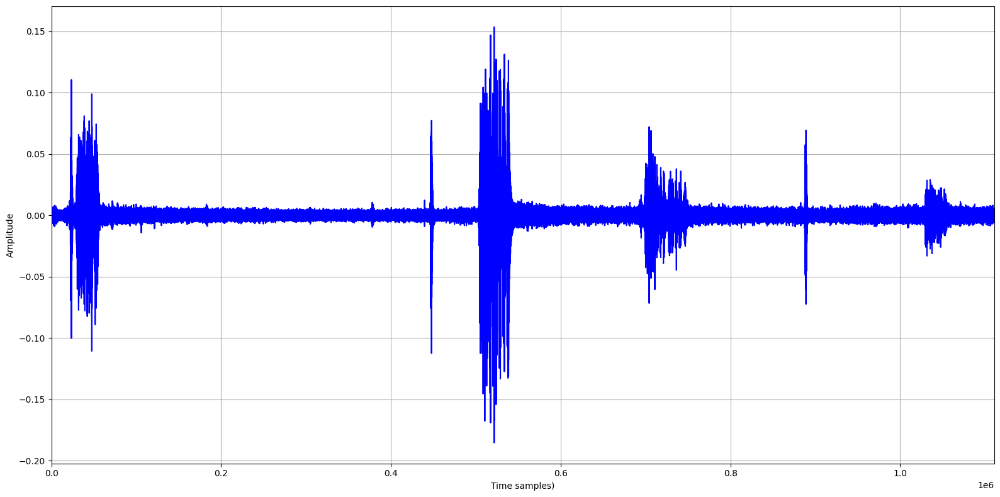



Bandpass
Signal shape: torch.Size([1110935])
 Sampling rate: 32000



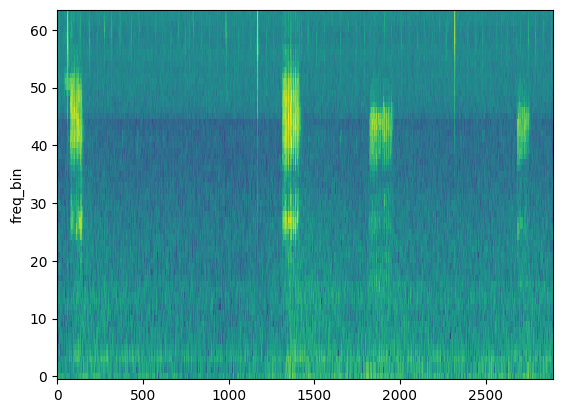

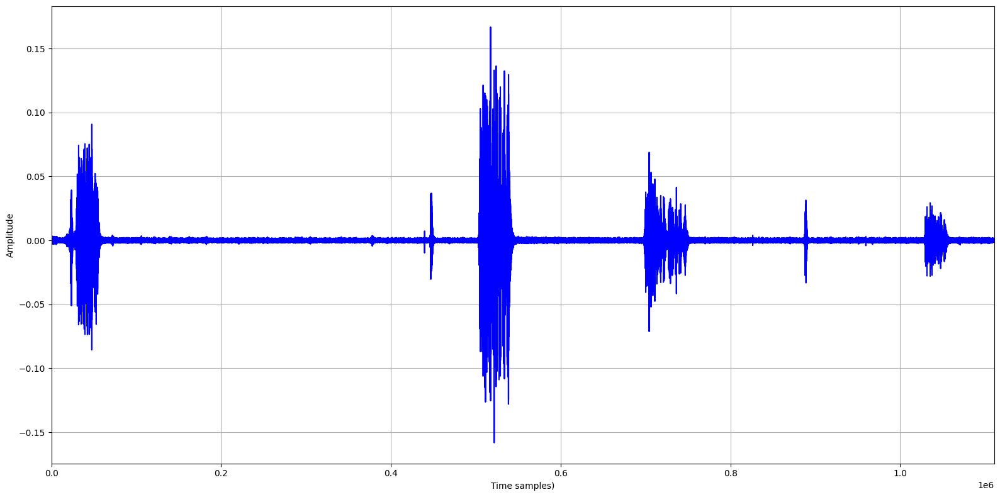



Stationary noise reduction
Signal shape: (1110935,)
 Sampling rate: 32000



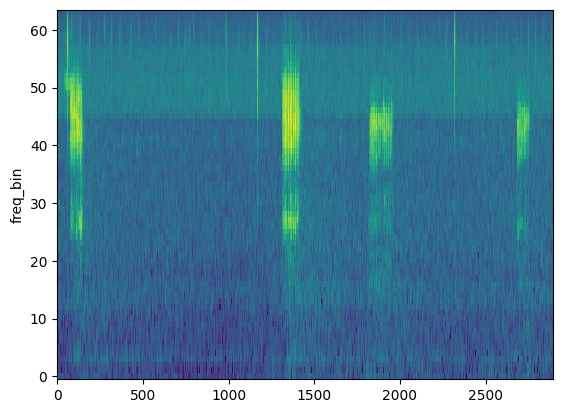

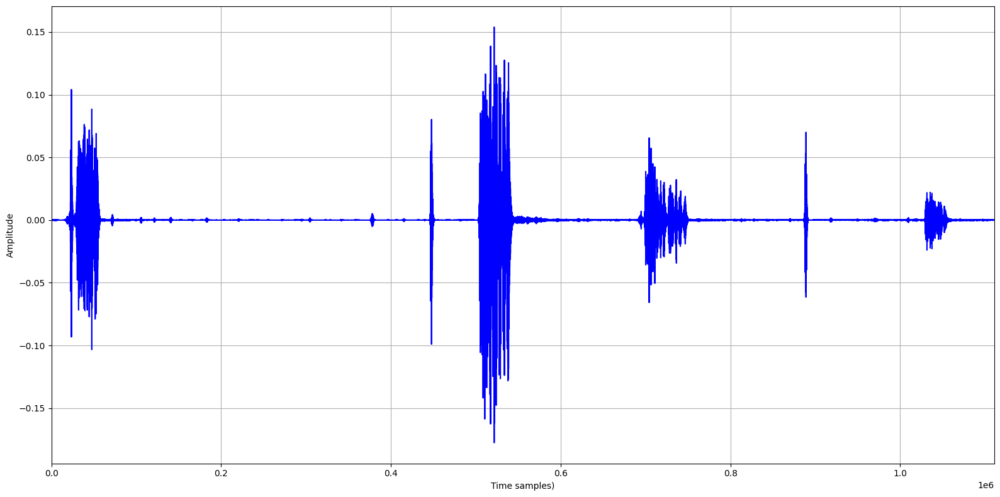



Non-Stationary noise reduction
Signal shape: (1110935,)
 Sampling rate: 32000



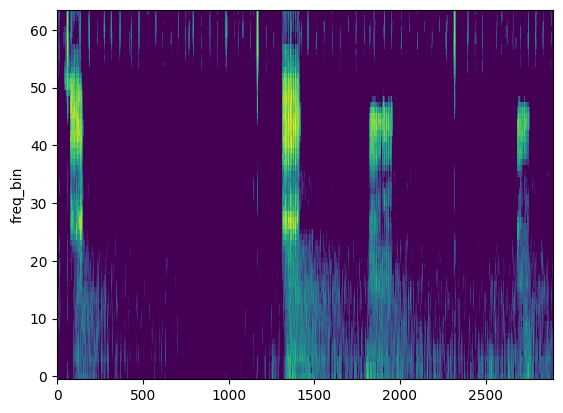

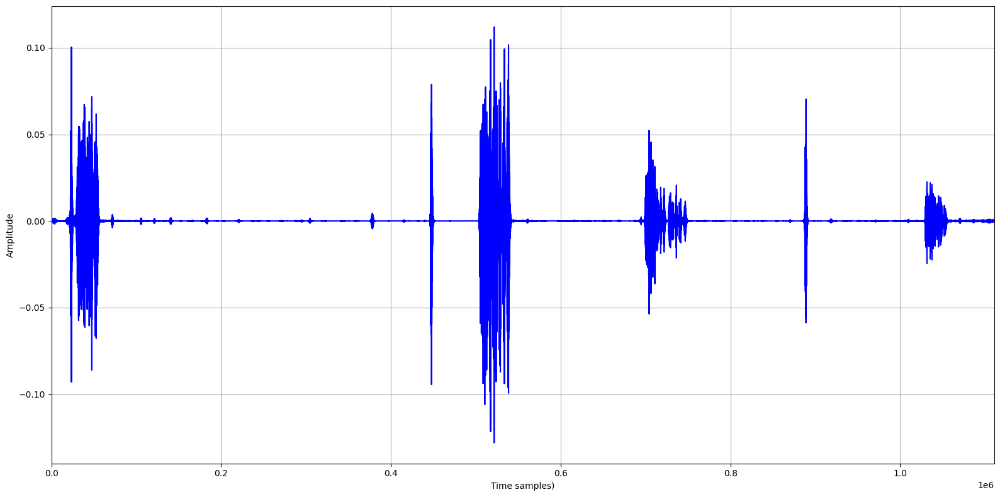

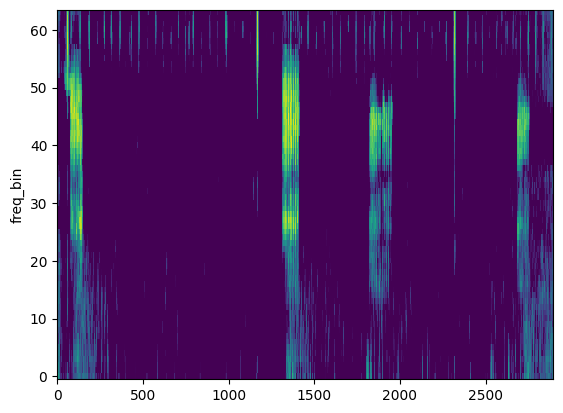

In [25]:
import torch

i = 10
# for i in range (1):
filename = f"{sample.iloc[i]['id']}.mp3"
latin_name = f"{sample.iloc[i]['Latin name']}"
also = f"{sample.iloc[i]['also']}"
quality = f"{sample.iloc[i]['q']}"
sig, sr = librosa.load(f"/mnt/d/recordings_30/{latin_name}/{filename}", sr=None)
print(f"filename: {filename}\n latin name: {latin_name}\n also: {also}\n quality: {quality}\n")

print("Source")
plot_waveform(sig, sr)
plot_torch_waveform(torch.from_numpy(sig).unsqueeze(0))
print("\n")

print("Bandpass")
sos = signal.butter(10, 50, 'hp', fs=1000, output='sos')
# filtered = bandpass(sig, [500, 20000], sr)
filtered = bandpass(torch.from_numpy(sig))
plot_waveform(filtered, sr)
plot_torch_waveform(filtered.unsqueeze(0))
print("\n")

print("Stationary noise reduction")
filtered = nr.reduce_noise(y = sig, sr = sr, n_std_thresh_stationary = 1.5, stationary = True)
plot_waveform(filtered, sr)
plot_torch_waveform(torch.from_numpy(filtered).unsqueeze(0))
print("\n")
     
print("Non-Stationary noise reduction")
filtered = nr.reduce_noise(y = sig, sr = sr, thresh_n_mult_nonstationary = 2,stationary = False)
plot_waveform(filtered, sr)
plot_torch_waveform(torch.from_numpy(filtered).unsqueeze(0))
print("\n")